# IBM Applied Data Science Capstone 

### Helping investors find the perfect location to open a coffee shop in Toronto, Canada

In [1]:
# installing and importing all the necessary packages
import numpy as np 
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# library to handle JSON files
import json 

# installing geocoder
! pip install geocoder
import geocoder 

# library to handle requests
import requests 
# tranform JSON file into a pandas dataframe
from pandas.io.json import json_normalize 

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

# map rendering library
! pip install folium
import folium 

# install and import beautifulsoup
! pip install beautifulsoup4
from bs4 import BeautifulSoup

# install lxml
! pip install lxml
import lxml.html as lh

print('Libraries imported.')

     |████████████████████████████████| 98 kB 11.7 MB/s eta 0:00:01
     |████████████████████████████████| 94 kB 8.1 MB/s  eta 0:00:01
Libraries imported.


In [2]:
# Extracting the neighbourhood data using beautiful soup 
url='https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'

result = requests.get(url)
data_html = BeautifulSoup(result.content)


soup = BeautifulSoup(str(data_html))

neigh = soup.find('table')

table_str = str(neigh.extract())

# saving the data into a pandas dataframe
df = pd.read_html(table_str,flavor='html5lib')[0]

df.head()

,Postal Code,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


In [3]:
# Cleaning the data frame

# filter out the rows where 'Borough' == 'Not assigned'
df1 = df[df['Borough'] != 'Not assigned'].reset_index(drop=True)

# set a value for neighbourhood when neighbourhood == not assigned 
df1['Neighbourhood'] = np.where((df1['Neighbourhood'] == 'Not assigned') , df1['Borough'], df1['Neighbourhood'])
df = df1
df.head()

,Postal Code,Borough,Neighbourhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"


In [4]:
# Find the dimensions of the cleaned data frame
df.shape

(103, 3)

In [6]:
df.head()

,Postal Code,Borough,Neighbourhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"


#### Finding the geographical latitudes and longitudes for each neighbourhood

In [7]:
# We will now add the latitude and the longitude columns to the dataframe
df_latLon = df.reindex(df.columns.tolist() + ['Latitude', 'Longitude'], axis=1)
df = df_latLon
df.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,NaN,NaN
1,M4A,North York,Victoria Village,NaN,NaN
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",NaN,NaN
3,M6A,North York,"Lawrence Manor, Lawrence Heights",NaN,NaN
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",NaN,NaN


In [8]:
# Using geocoder we will get the latitudes and longitudes for each neighbourhood and populate them in the dataframe
import geocoder
postal_code = df['Postal Code']

# Using while Statement
latitude = []
longitude = []
n = 0

while n < len(postal_code):
    g = geocoder.arcgis('{}, Toronto, Ontario'.format(postal_code[n]))
    lat_lng_coords = g.latlng
#     print('The geograpical coordinate of {} are {}, {}.'.format(postal_code[n], lat_lng_coords[0], lat_lng_coords[1]))
    latitude.append(lat_lng_coords[0])
    longitude.append(lat_lng_coords[1])
    n = n + 1

df['Latitude'] = latitude
df['Longitude'] = longitude

df.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.75245,-79.32991
1,M4A,North York,Victoria Village,43.73057,-79.31306
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.65512,-79.36264
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.72327,-79.45042
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.66253,-79.39188


In [9]:
# Displaying the shape of the newly updated dataframe
df.shape

(103, 5)

In [10]:
# Finding out how many neighborhoods in each borough
df.groupby('Borough').count()['Neighbourhood']

Borough
Central Toronto      9
Downtown Toronto    19
East Toronto         5
East York            5
Etobicoke           12
Mississauga          1
North York          24
Scarborough         17
West Toronto         6
York                 5
Name: Neighbourhood, dtype: int64

In [12]:
# creating a Toronto dataframe to use
df_toronto = df
df_toronto.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.75245,-79.32991
1,M4A,North York,Victoria Village,43.73057,-79.31306
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.65512,-79.36264
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.72327,-79.45042
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.66253,-79.39188


#### Exploring neibourhoods in Toronto

In [13]:
#Create list with the Boroughs (for later use)
boroughs = df_toronto['Borough'].unique().tolist()

In [14]:
#  use geocoder to obtain the latitudes and longitudes for the city of toronto
t = geocoder.arcgis('{}, Toronto, Ontario')
t_lat = t.latlng[0]
t_long = t.latlng[1]
print('The geograpical coordinates for the city of Toronto are {}, {}.'.format(t_lat, t_long))

The geograpical coordinates for the city of Toronto are 43.648690000000045, -79.38543999999996.


In [17]:
# Create a map of Toronto with using latitutes and longitute for the city
map_toronto = folium.Map(location=[t_lat, t_long], zoom_start=11)

# add markers to map
for lat, lng, borough, neighbourhood in zip(df_toronto['Latitude'], df_toronto['Longitude'], df_toronto['Borough'], df_toronto['Neighbourhood']):
    label = '{}, {}'.format('Neighbourhood', 'Borough')
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

In [18]:
# @hidden_cell
# Define foursquare credentials and version
CLIENT_ID = 'QMGRAV35HM4J0RRZL43O1UTUI245OPC23UKVZ0YEHFSTWJOI' # your Foursquare ID
CLIENT_SECRET = 'DN32WVDGN2ZK43H3FXXH22YFXPHMBLKR5F22RZCKKVMD1WWB' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 500 # A default Foursquare API limit value

#### Exploring venues using the foursquare api

In [19]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    LIMIT = 500 # limit of number of venues returned by Foursquare API
    radius = 1000 # define radius
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
     
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [21]:
# Getting venues for all neighborhoods in our dataset
toronto_venues = getNearbyVenues(names=df_toronto['Neighbourhood'],
                                latitudes=df_toronto['Latitude'],
                                longitudes=df_toronto['Longitude'])

In [22]:
toronto_venues.head()

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.75245,-79.32991,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant
1,Parkwoods,43.75245,-79.32991,Brookbanks Park,43.751976,-79.332140,Park
2,Parkwoods,43.75245,-79.32991,Tim Hortons,43.760668,-79.326368,Café
3,Parkwoods,43.75245,-79.32991,Bruno's valu-mart,43.746143,-79.324630,Grocery Store
4,Parkwoods,43.75245,-79.32991,A&W,43.760643,-79.326865,Fast Food Restaurant


#### Finding all the the unique venues

In [23]:
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 338 uniques categories.


In [24]:
print("The Venue Categories are", toronto_venues['Venue Category'].unique())

The Venue Categories are ['Caribbean Restaurant' 'Park' 'Café' 'Grocery Store'
 'Fast Food Restaurant' 'Pharmacy' 'Supermarket' 'Fish & Chips Shop'
 'Pizza Place' 'Food & Drink Shop' 'Intersection' 'Bus Stop'
 'Convenience Store' 'Skating Rink' 'Shop & Service' 'Train Station'
 'Discount Store' 'Tennis Court' 'Laundry Service' 'ATM'
 'Chinese Restaurant' 'Middle Eastern Restaurant' 'Thai Restaurant'
 'Hockey Arena' 'Portuguese Restaurant' 'Coffee Shop' 'French Restaurant'
 'Spa' 'Bakery' 'Breakfast Spot' 'Restaurant' 'Italian Restaurant' 'Pub'
 'Farmers Market' 'Liquor Store' 'Historic Site' 'Yoga Studio'
 'Distribution Center' 'Event Space' 'Chocolate Shop' 'Pool'
 'Tech Startup' 'Performing Arts Venue' 'Dessert Shop'
 'Mediterranean Restaurant' 'German Restaurant' 'Theater'
 'Gym / Fitness Center' 'Furniture / Home Store' 'Food Truck' 'Diner'
 'Gastropub' 'Animal Shelter' 'Asian Restaurant' 'Shoe Store'
 'Karaoke Bar' 'Hotel' 'Brewery' 'Gym Pool' 'Art Gallery' 'BBQ Joint'
 'Cosmetics

In [25]:
# Are there any coffee shops in the venues?
"Coffee Shop" in toronto_venues['Venue Category'].unique()

True

In [26]:
# Exploring all the neibourhoods

# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighbourhoods'] = toronto_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

print(toronto_onehot.shape)
toronto_onehot.head()

(5144, 339)


,Neighbourhoods,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Beach Bar,Beer Bar,Beer Store,Belgian Restaurant,Big Box Store,Bike Shop,Bistro,Bookstore,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Castle,Cemetery,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Churrascaria,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,College Quad,College Rec Center,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Leather Goods Store,Light Rail Station,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Movie Theater,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsagent,Nightclub,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Supply Store,Paintball Field,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Pide Place,Pie Shop,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Poutine Place,Print Shop,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Climbing Spot,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Science Museum,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping 

In [27]:
# grouping rows by neighborhood and by taking the mean of the frequency of occurrence of each category
toronto_grouped = toronto_onehot.groupby(["Neighbourhoods"]).mean().reset_index()
print(toronto_grouped.shape)
toronto_grouped.head()

(99, 339)


,Neighbourhoods,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Beach Bar,Beer Bar,Beer Store,Belgian Restaurant,Big Box Store,Bike Shop,Bistro,Bookstore,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Castle,Cemetery,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Churrascaria,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,College Quad,College Rec Center,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Doner Restaurant,Donut Shop,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Leather Goods Store,Light Rail Station,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Movie Theater,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Newsagent,Nightclub,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Supply Store,Paintball Field,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Pide Place,Pie Shop,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Poutine Place,Print Shop,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Climbing Spot,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Science Museum,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping 

#### Finding the 10 ten venues in each neibourhood

In [28]:
# function for sorting the venues in decending order
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

# creating a data frame to store the top 10 venues of each neighbourhood
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhoods']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe 
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Neighbourhoods'] = toronto_grouped['Neighbourhoods']

for ind in np.arange(toronto_grouped.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grouped.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sorted.head()

,Neighbourhoods,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Chinese Restaurant,Shopping Mall,Sandwich Place,Restaurant,Pizza Place,Lounge,Bank,Bakery,Badminton Court,Noodle House
1,"Alderwood, Long Branch",Pizza Place,Coffee Shop,Bank,Pharmacy,Park,Grocery Store,Bar,Beer Store,Liquor Store,Seafood Restaurant
2,"Bathurst Manor, Wilson Heights, Downsview North",Bank,Park,Pizza Place,Gas Station,Coffee Shop,Restaurant,Bus Line,Baseball Field,Sushi Restaurant,Supermarket
3,Bayview Village,Park,Japanese Restaurant,Chinese Restaurant,Bank,Café,Trail,Eastern European Restaurant,Elementary School,Escape Room,Ethiopian Restaurant
4,"Bedford Park, Lawrence Manor East",Coffee Shop,Italian Restaurant,Sandwich Place,Comfort Food Restaurant,Locksmith,Bagel Shop,Bakery,Bank,Juice Bar,Sushi Restaurant


In [29]:
cs = toronto_grouped[["Neighbourhoods","Coffee Shop"]]
cs.head() 

,Neighbourhoods,Coffee Shop
0,Agincourt,0.025000
1,"Alderwood, Long Branch",0.107143
2,"Bathurst Manor, Wilson Heights, Downsview North",0.057143
3,Bayview Village,0.000000
4,"Bedford Park, Lawrence Manor East",0.083333


In [30]:
cs = cs.rename(columns={'Neighbourhoods':'Neighbourhood'})

#### We will use k-means clustering to cluster the neighbourhoods. We will find the best K using the Elbow Point method.

In [31]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=15, random_state=8)
X = cs.drop(['Neighbourhood'], axis=1)

In [32]:
kmeans.fit(X)
kmeans.labels_[0:10]

array([0, 1, 1, 0, 1, 1, 0, 1, 1, 1], dtype=int32)

In [33]:
def get_inertia(n_clusters):
    km = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=15, random_state=8)
    km.fit(X)
    return km.inertia_

In [34]:
scores = [get_inertia(x) for x in range(2, 21)]

Text(0, 0.5, 'Error')

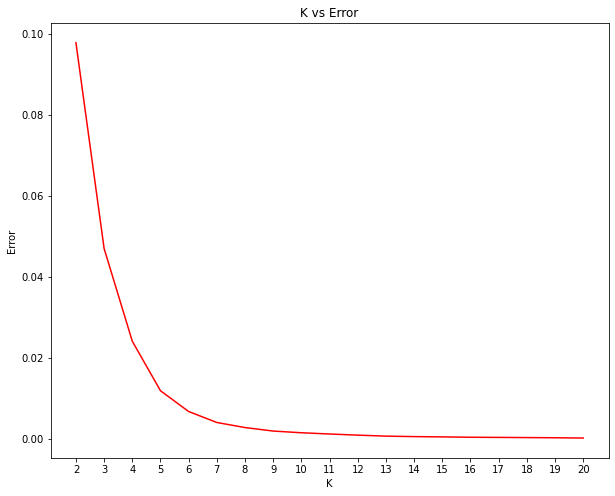

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=[10, 8])
sns.lineplot(x=range(2, 21), y=scores, color='r')
plt.title("K vs Error")
plt.xticks(range(2, 21))
plt.xlabel("K")
plt.ylabel("Error")

In [36]:
! pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer

     |████████████████████████████████| 271 kB 23.2 MB/s eta 0:00:01


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


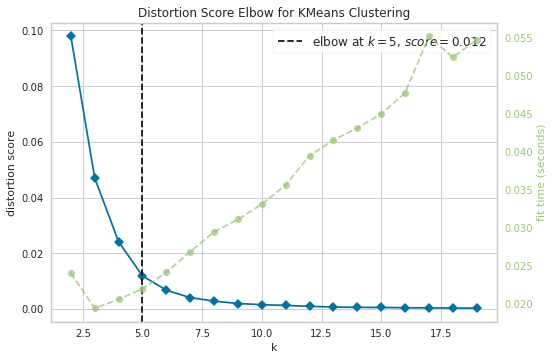

In [37]:
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer

model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,20))

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()

In [38]:
kclusters = 5

toronto_grouped_clustering = cs.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 1, 3, 0, 1, 4, 0, 3, 1, 3], dtype=int32)

In [41]:
# create a new dataframe that includes the cluster 
toronto_merged = cs.copy()

# add clustering labels
toronto_merged["Cluster Labels"] = kmeans.labels_

In [42]:
toronto_merged.head()

,Neighbourhood,Coffee Shop,Cluster Labels
0,Agincourt,0.025000,0
1,"Alderwood, Long Branch",0.107143,1
2,"Bathurst Manor, Wilson Heights, Downsview North",0.057143,3
3,Bayview Village,0.000000,0
4,"Bedford Park, Lawrence Manor East",0.083333,1


In [43]:
# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
toronto_merged = toronto_merged.join(toronto_venues.set_index("Neighbourhood"), on="Neighbourhood")

print(toronto_merged.shape)
toronto_merged.head()

(5144, 9)


,Neighbourhood,Coffee Shop,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Agincourt,0.025,0,43.79452,-79.26708,Bestco Food Market 鴻華超級市場,43.796514,-79.270790,Supermarket
0,Agincourt,0.025,0,43.79452,-79.26708,Wonton Chai Noodle 雲吞仔,43.787722,-79.269552,Noodle House
0,Agincourt,0.025,0,43.79452,-79.26708,Yummy Cantonese Restaurant 老西関腸粉,43.787568,-79.269585,Cantonese Restaurant
0,Agincourt,0.025,0,43.79452,-79.26708,Panagio's Breakfast & Lunch,43.792370,-79.260203,Breakfast Spot
0,Agincourt,0.025,0,43.79452,-79.26708,Jesse Jr. (Filipino Foods & Restaurant),43.787565,-79.268810,Restaurant


In [45]:
# sort the results by Cluster Labels
print(toronto_merged.shape)
toronto_merged.sort_values(["Cluster Labels"], inplace=True)
toronto_merged

(5144, 9)


,Neighbourhood,Coffee Shop,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Agincourt,0.025000,0,43.79452,-79.26708,Bestco Food Market 鴻華超級市場,43.796514,-79.270790,Supermarket
66,Rosedale,0.000000,0,43.68190,-79.37829,Sleep Country Canada,43.679912,-79.389898,Mattress Store
66,Rosedale,0.000000,0,43.68190,-79.37829,Milkman's Lane,43.676352,-79.373842,Trail
66,Rosedale,0.000000,0,43.68190,-79.37829,Scoops Convenience Boutique,43.686148,-79.375828,Candy Store
66,Rosedale,0.000000,0,43.68190,-79.37829,Whitney Park,43.682036,-79.373788,Park
66,Rosedale,0.000000,0,43.68190,-79.37829,Rosedale Park,43.682328,-79.378934,Playground
66,Rosedale,0.000000,0,43.68190,-79.37829,The Beer Store,43.680217,-79.390074,Beer Store
66,Rosedale,0.000000,0,43.68190,-79.37829,Summerhill,43.682976,-79.389123,Neighborhood
66,Rosedale,0.000000,0,43.68190,-79.37829,Running Room,43.679645,-79.390319,Sporting Goods Shop
66,Rosedale,0.000000,0,43.68190,-79.37829,Rosehill Reservoir,43.686304,-79.388133,Park


In [47]:
# Finding all the coffee shops
toronto_merged['Venue Category'].value_counts()['Coffee Shop']

395

In [48]:
# Visualizing the clusters

# create map
map_clusters = folium.Map(location=[t_lat, t_long], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]


# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Neighbourhood Latitude'], toronto_merged['Neighbourhood Longitude'], toronto_merged['Neighbourhood'], toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster-1)],
        fill=True,
        fill_color=rainbow[int(cluster-1)],
        fill_opacity=0.8).add_to(map_clusters)
       
map_clusters

In [50]:
# cluster labels per neighbourhood
cs["Cluster Labels"] = kmeans.labels_
cs.head()

,Neighbourhood,Coffee Shop,Cluster Labels
0,Agincourt,0.025000,0
1,"Alderwood, Long Branch",0.107143,1
2,"Bathurst Manor, Wilson Heights, Downsview North",0.057143,3
3,Bayview Village,0.000000,0
4,"Bedford Park, Lawrence Manor East",0.083333,1


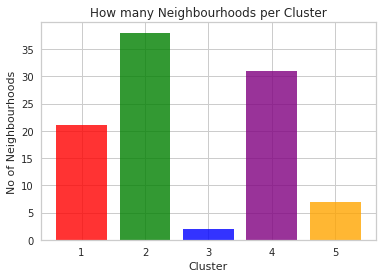

In [51]:
# ploting all number of neighbourhoods in each cluster
%matplotlib inline
from matplotlib import pyplot as plt

objects = (1,2,3,4,5)
y_pos = np.arange(len(objects))
performance = cs['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance['Cluster Labels'].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'green','blue', 'purple', 'orange'])
plt.xticks(y_pos, objects)
plt.ylabel('No of Neighbourhoods')
plt.xlabel('Cluster')
plt.title('How many Neighbourhoods per Cluster')

plt.show()

In [52]:
# How many neighborhoods in each cluster
cs['Cluster Labels'].value_counts()

1    38
3    31
0    21
4     7
2     2
Name: Cluster Labels, dtype: int64

In [53]:
# This will create a dataframe with borough of each neighborhood which we will merge with each cluster dataframe
df_new = df[['Borough', 'Neighbourhood']]
df_new.head()
print(df_new.shape)

(103, 2)


In [54]:
# Cluster 1- Red 
cluster1 = toronto_merged.loc[toronto_merged['Cluster Labels'] == 0]
df_cluster1 = pd.merge(df_new, cluster1, on='Neighbourhood')
print(df_cluster1.shape)
df_cluster1

(551, 10)


,Borough,Neighbourhood,Coffee Shop,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,North York,Parkwoods,0.000000,0,43.75245,-79.32991,TTC Stop 9083,43.759251,-79.334000,Bus Stop
1,North York,Parkwoods,0.000000,0,43.75245,-79.32991,TTC Stop #09083,43.759655,-79.332223,Bus Stop
2,North York,Parkwoods,0.000000,0,43.75245,-79.32991,DVP at York Mills,43.758899,-79.334099,Intersection
3,North York,Parkwoods,0.000000,0,43.75245,-79.32991,Variety Store,43.751974,-79.333114,Food & Drink Shop
4,North York,Parkwoods,0.000000,0,43.75245,-79.32991,Pizza Pizza,43.760231,-79.325666,Pizza Place
5,North York,Parkwoods,0.000000,0,43.75245,-79.32991,High Street Fish & Chips,43.745260,-79.324949,Fish & Chips Shop
6,North York,Parkwoods,0.000000,0,43.75245,-79.32991,Food Basics,43.760549,-79.326045,Supermarket
7,North York,Parkwoods,0.000000,0,43.75245,-79.32991,Shoppers Drug Mart,43.745315,-79.325800,Pharmacy
8,North York,Parkwoods,0.000000,0,43.75245,-79.32991,A&W,43.760643,-79.326865,Fast Food Restaurant
9,North York,Parkwoods,0.000000,0,43.75245,-79.32991,Bruno's valu-mart,43.746143,-79.324630,Grocery Store


In [55]:
# Cluster 2 -Green 
cluster2=toronto_merged.loc[toronto_merged['Cluster Labels'] == 1]
df_cluster2 = pd.merge(df_new, cluster2, on='Neighbourhood')
print(df_cluster2.shape)
df_cluster2

(2633, 10)


,Borough,Neighbourhood,Coffee Shop,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,North York,Victoria Village,0.100000,1,43.73057,-79.31306,Portugril,43.725819,-79.312785,Portuguese Restaurant
1,North York,Victoria Village,0.100000,1,43.73057,-79.31306,Victoria Village Arena,43.723481,-79.315635,Hockey Arena
2,North York,Victoria Village,0.100000,1,43.73057,-79.31306,Jatujak,43.736208,-79.307668,Thai Restaurant
3,North York,Victoria Village,0.100000,1,43.73057,-79.31306,Armenian Kitchen,43.731071,-79.305390,Middle Eastern Restaurant
4,North York,Victoria Village,0.100000,1,43.73057,-79.31306,Tim Hortons,43.725517,-79.313103,Coffee Shop
5,North York,Victoria Village,0.100000,1,43.73057,-79.31306,Artistic Nails,43.736120,-79.308080,Spa
6,North York,Victoria Village,0.100000,1,43.73057,-79.31306,Bamboo Garden,43.735968,-79.306236,Chinese Restaurant
7,North York,Victoria Village,0.100000,1,43.73057,-79.31306,Wigmore Park,43.731023,-79.310771,Park
8,North York,Victoria Village,0.100000,1,43.73057,-79.31306,Pizza Nova,43.725824,-79.312860,Pizza Place
9,North York,Victoria Village,0.100000,1,43.73057,-79.31306,The Frig,43.727051,-79.317418,French Restaurant


In [56]:
# Cluster 3 - Blue 
cluster3=toronto_merged.loc[toronto_merged['Cluster Labels'] == 2]
df_cluster3 = pd.merge(df_new, cluster3, on='Neighbourhood')
print(df_cluster3.shape)
df_cluster3

(16, 10)


,Borough,Neighbourhood,Coffee Shop,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,North York,"North Park, Maple Leaf Park, Upwood Park",0.25,2,43.71381,-79.48874,Rustic Bakery,43.715414,-79.490300,Bakery
1,North York,"North Park, Maple Leaf Park, Upwood Park",0.25,2,43.71381,-79.48874,Petro-Canada,43.705891,-79.487841,Gas Station
2,North York,"North Park, Maple Leaf Park, Upwood Park",0.25,2,43.71381,-79.48874,Coffee Time,43.705864,-79.488573,Coffee Shop
3,North York,"North Park, Maple Leaf Park, Upwood Park",0.25,2,43.71381,-79.48874,North Park,43.720478,-79.485729,Park
4,North York,"North Park, Maple Leaf Park, Upwood Park",0.25,2,43.71381,-79.48874,Cataldi supermarket,43.715387,-79.480004,Convenience Store
5,North York,"North Park, Maple Leaf Park, Upwood Park",0.25,2,43.71381,-79.48874,Tim Hortons,43.719431,-79.480723,Coffee Shop
6,North York,"North Park, Maple Leaf Park, Upwood Park",0.25,2,43.71381,-79.48874,Lucky Dragon Chinese Food,43.719463,-79.480755,Chinese Restaurant
7,North York,"North Park, Maple Leaf Park, Upwood Park",0.25,2,43.71381,-79.48874,Amesbury Sports Complex Arena & Outdoor Pool,43.705935,-79.486880,Athletics & Sports
8,North York,"Humberlea, Emery",0.25,2,43.73367,-79.53769,Panino Cappuccino,43.738389,-79.539347,Café
9,North York,"Humberlea, Emery",0.25,2,43.73367,-79.53769,Tim Hortons,43.735035,-79.533852,Coffee Shop


In [57]:
# Cluster 4 - Purple 
cluster4=toronto_merged.loc[toronto_merged['Cluster Labels'] == 3]
df_cluster4 = pd.merge(df_new, cluster4, on='Neighbourhood')
print(df_cluster4.shape)
df_cluster4

(1945, 10)


,Borough,Neighbourhood,Coffee Shop,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,Grande Cheese,43.720146,-79.457951,Cheese Shop
1,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,Subway,43.716469,-79.454898,Sandwich Place
2,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,Flemington Park,43.721211,-79.444563,Park
3,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,Best Damn Sports Bar And Grill,43.719137,-79.457207,Bar
4,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,McDonald's,43.716644,-79.446716,Fast Food Restaurant
5,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,TTC Gateway Yorkdale,43.725226,-79.447784,Convenience Store
6,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,Shoeless Joe's,43.718625,-79.455993,Restaurant
7,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,Seoul House,43.719902,-79.457832,Korean Restaurant
8,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,Fortinos,43.716656,-79.447257,Grocery Store
9,North York,"Lawrence Manor, Lawrence Heights",0.041237,3,43.72327,-79.45042,KFC,43.716600,-79.447000,Fast Food Restaurant


In [58]:
# Cluster 5 - Orange
cluster5=toronto_merged.loc[toronto_merged['Cluster Labels'] == 4]
df_cluster5 = pd.merge(df_new, cluster5, on='Neighbourhood')
print(df_cluster5.shape)
df_cluster5.head()

(319, 10)


,Borough,Neighbourhood,Coffee Shop,Cluster Labels,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Downtown Toronto,"Regent Park, Harbourfront",0.15,4,43.65512,-79.36264,Bellisimo Pizzeria & Ristorante,43.648748,-79.368684,Pizza Place
1,Downtown Toronto,"Regent Park, Harbourfront",0.15,4,43.65512,-79.36264,Pearl Diver,43.651481,-79.373600,Gastropub
2,Downtown Toronto,"Regent Park, Harbourfront",0.15,4,43.65512,-79.36264,The Aviary,43.653634,-79.354662,Pub
3,Downtown Toronto,"Regent Park, Harbourfront",0.15,4,43.65512,-79.36264,Bulk Barn,43.649994,-79.370099,Grocery Store
4,Downtown Toronto,"Regent Park, Harbourfront",0.15,4,43.65512,-79.36264,Ontario Spring Water Sake Company,43.649922,-79.360073,Brewery


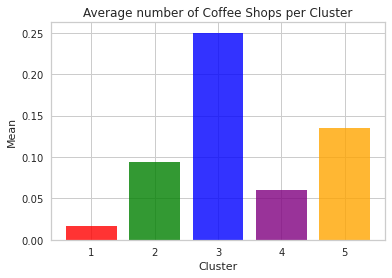

In [59]:
# ploting the number of coffee shops per cluster
clusters_mean = [df_cluster1['Coffee Shop'].mean(),df_cluster2['Coffee Shop'].mean(),df_cluster3['Coffee Shop'].mean(),
                 df_cluster4['Coffee Shop'].mean(),df_cluster5['Coffee Shop'].mean()]
objects = (1,2,3,4,5)
y_pos = np.arange(len(objects))
perf = clusters_mean
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'green','blue', 'purple', 'orange'])
plt.xticks(y_pos, objects)
plt.ylabel('Mean')
plt.xlabel('Cluster')
plt.title('Average number of Coffee Shops per Cluster')

plt.show()